In [1]:
# Get thinkdsp.py

import os

if not os.path.exists('thinkdsp.py'):
    !wget https://github.com/AllenDowney/ThinkDSP/raw/master/code/thinkdsp.py

import thinkplot
import scipy.fftpack
import numpy as np

from thinkdsp import decorate, UncorrelatedGaussianNoise, read_wave, Spectrogram
from scipy.stats import linregress

PI2 = np.pi * 2

Упражнение 6.1

In [3]:
signal = UncorrelatedGaussianNoise()
noise = signal.make_wave(duration=1.0, framerate=16384)
noise.ys.shape

(16384,)

In [4]:
ns = 2 ** np.arange(6, 13)
ns

array([  64,  128,  256,  512, 1024, 2048, 4096], dtype=int32)

In [5]:
def plot_bests(bests):    
    thinkplot.plot(ns, bests)
    thinkplot.config(xscale='log', yscale='log', legend=False)
    
    x = np.log(ns)
    y = np.log(bests)
    t = linregress(x,y)
    slope = t[0]

    return slope

In [6]:
def analyze1(ys, fs, ts):
    args = np.outer(ts, fs)
    M = np.cos(PI2 * args)
    amps = np.linalg.solve(M, ys)
    return amps

107 μs ± 0 ns per loop (mean ± std. dev. of 1 run, 10,000 loops each)
375 μs ± 0 ns per loop (mean ± std. dev. of 1 run, 1,000 loops each)
2.59 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 100 loops each)
58.3 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 10 loops each)
748 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)
1.61 s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)
1.95 s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


2.669781448483937

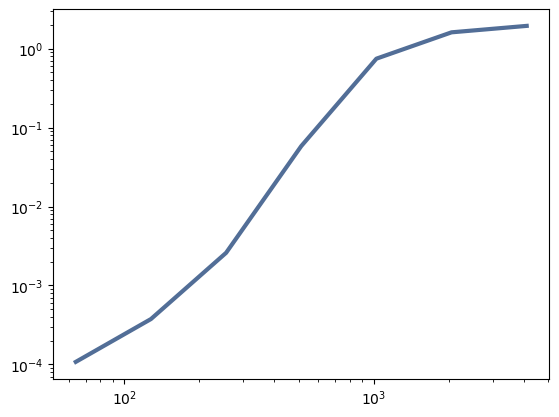

In [7]:
results = []
for N in ns:
    ts = (0.5 + np.arange(N)) / N
    freqs = (0.5 + np.arange(N)) / 2
    ys = noise.ys[:N]
    result = %timeit -r1 -o analyze1(ys, freqs, ts)
    results.append(result)
    
bests = [result.best for result in results]
plot_bests(bests)


In [8]:
def analyze2(ys, fs, ts):
    args = np.outer(ts, fs)
    M = np.cos(PI2 * args)
    amps = np.dot(M, ys) / 2
    return amps

73.7 μs ± 0 ns per loop (mean ± std. dev. of 1 run, 10,000 loops each)
223 μs ± 0 ns per loop (mean ± std. dev. of 1 run, 10,000 loops each)
921 μs ± 0 ns per loop (mean ± std. dev. of 1 run, 1,000 loops each)
4.38 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 100 loops each)
16.7 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 100 loops each)
71.5 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 10 loops each)
283 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


2.019682793395109

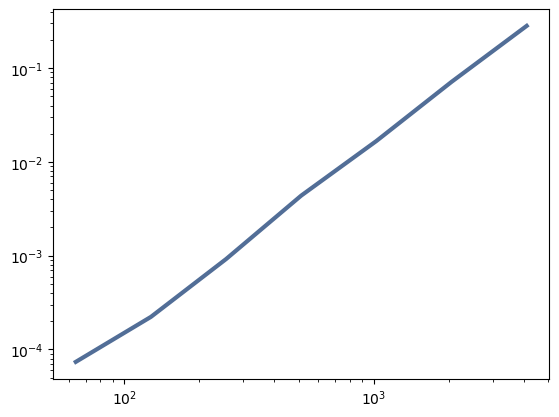

In [9]:
results = []
for N in ns:
    ts = (0.5 + np.arange(N)) / N
    freqs = (0.5 + np.arange(N)) / 2
    ys = noise.ys[:N]
    result = %timeit -r1 -o analyze2(ys, freqs, ts)
    results.append(result)
    
bests2 = [result.best for result in results]
plot_bests(bests2)

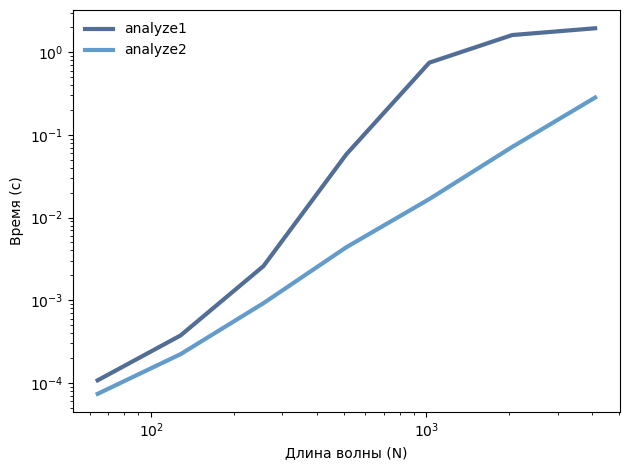

In [10]:
thinkplot.plot(ns, bests, label='analyze1')
thinkplot.plot(ns, bests2, label='analyze2')
decorate(xlabel='Длина волны (N)', ylabel='Время (с)', **dict(xscale='log', yscale='log'))

Упражнение 6.2

In [12]:
wave = read_wave('760961__audiocoffee__inspiring-dream-short-ver.wav')
wave.make_audio()

In [13]:
segment = wave.segment(start=1, duration=0.5)
segment.normalize()
segment.make_audio()

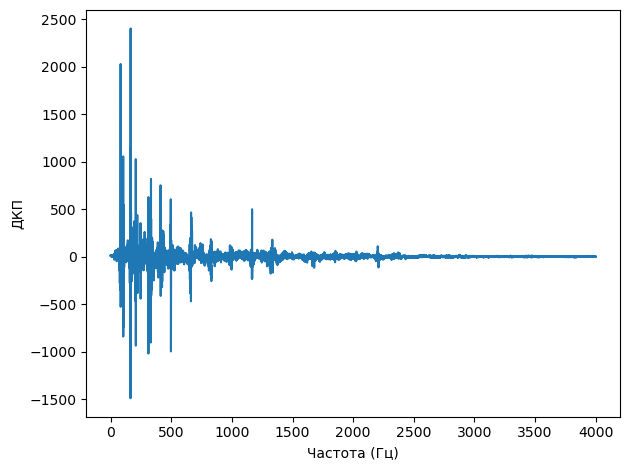

In [14]:
seg_dct = segment.make_dct()
seg_dct.plot(high=4000)
decorate(xlabel='Частота (Гц)', ylabel='ДКП')

In [15]:
def compress(dct, thresh=1):
    count = 0
    for i, amp in enumerate(dct.amps):
        if np.abs(amp) < thresh:
            dct.hs[i] = 0
            count += 1
            
    n = len(dct.amps)
    #print(count, n, 100 * count / n, sep='\t')

18634	22050	84.5079365079365


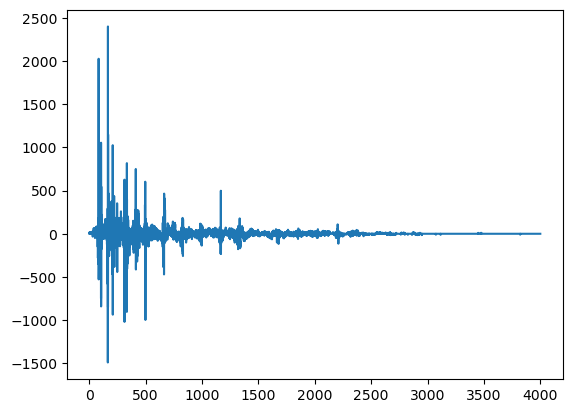

In [16]:
seg_dct = segment.make_dct()
compress(seg_dct, thresh=10)
seg_dct.plot(high=4000)

In [17]:
seg2 = seg_dct.make_wave()
seg2.make_audio()

In [18]:
def make_dct_spectrogram(wave, seg_length):
    window = np.hamming(seg_length)
    i, j = 0, seg_length
    step = seg_length // 2
    spec_map = {}

    while j < len(wave.ys):
        segment = wave.slice(i, j)
        segment.window(window)

        t = (segment.start + segment.end) / 2
        spec_map[t] = segment.make_dct()

        i += step
        j += step

    return Spectrogram(spec_map, seg_length)

In [19]:
spectro = make_dct_spectrogram(wave, seg_length=1024)
for t, dct in sorted(spectro.spec_map.items()):
    compress(dct, thresh=0.2)
wave2 = spectro.make_wave()

995	1024	97.16796875
993	1024	96.97265625
995	1024	97.16796875
995	1024	97.16796875
993	1024	96.97265625
993	1024	96.97265625
997	1024	97.36328125
997	1024	97.36328125
996	1024	97.265625
994	1024	97.0703125
991	1024	96.77734375
993	1024	96.97265625
994	1024	97.0703125
982	1024	95.8984375
993	1024	96.97265625
983	1024	95.99609375
977	1024	95.41015625
973	1024	95.01953125
977	1024	95.41015625
952	1024	92.96875
949	1024	92.67578125
968	1024	94.53125
964	1024	94.140625
922	1024	90.0390625
935	1024	91.30859375
910	1024	88.8671875
892	1024	87.109375
890	1024	86.9140625
870	1024	84.9609375
838	1024	81.8359375
830	1024	81.0546875
834	1024	81.4453125
823	1024	80.37109375
813	1024	79.39453125
775	1024	75.68359375
777	1024	75.87890625
750	1024	73.2421875
777	1024	75.87890625
791	1024	77.24609375
779	1024	76.07421875
719	1024	70.21484375
776	1024	75.78125
627	1024	61.23046875
626	1024	61.1328125
684	1024	66.796875
680	1024	66.40625
678	1024	66.2109375
687	1024	67.08984375
666	1024	65.0390625
669	1

In [20]:
wave2.make_audio()

Упражнение 6.3

In [22]:
def plot_angle(spectrum, thresh=1):
    angles = spectrum.angles
    angles[spectrum.amps < thresh] = np.nan
    thinkplot.plot(spectrum.fs, angles, 'x')
    decorate(xlabel='Частота (Гц)', ylabel='Фаза (радианы)')

In [23]:
def plot_three(spectrum, thresh=1):
    thinkplot.preplot(cols=3)
    spectrum.plot()
    thinkplot.subplot(2)
    plot_angle(spectrum, thresh=thresh)
    thinkplot.subplot(3)
    wave = spectrum.make_wave()
    wave.segment(duration=0.01).plot()
    wave.apodize()
    display(wave.make_audio())

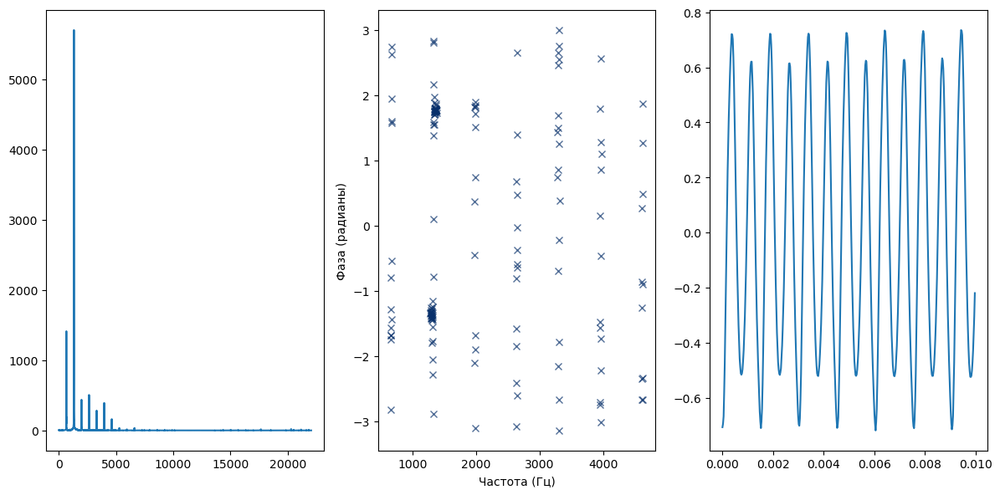

In [24]:
wave = read_wave('120994__thirsk__120-oboe.wav')
wave.make_audio()
segment = wave.segment(start=2.3, duration=0.7)

spectrum = segment.make_spectrum()
plot_three(spectrum, thresh=50)

In [25]:
def zero_angle(spectrum):
    res = spectrum.copy()
    res.hs = res.amps
    return res

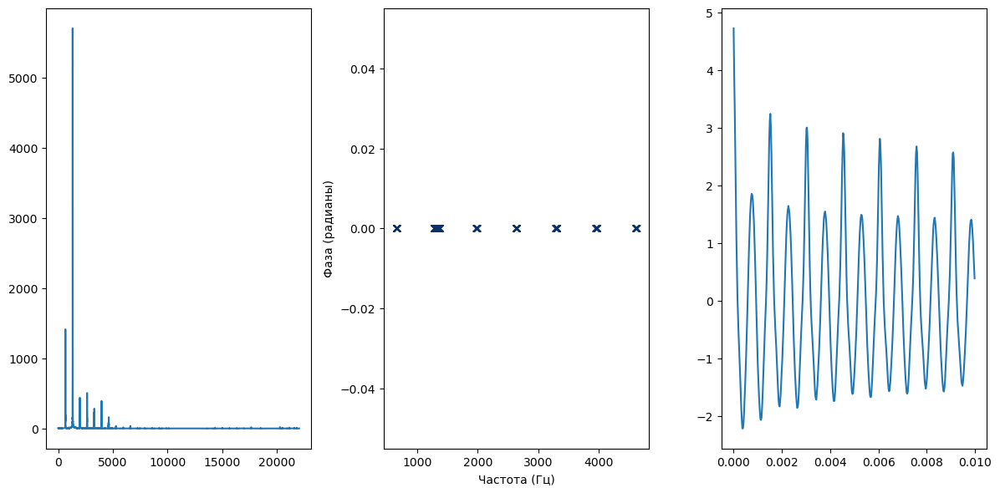

In [26]:
spectrum2 = zero_angle(spectrum)
plot_three(spectrum2, thresh=50)

In [27]:
def rotate_angle(spectrum, offset):
    res = spectrum.copy()
    res.hs *= np.exp(1j * offset)
    return res

In [28]:
def random_angle(spectrum):
    res = spectrum.copy()
    angles = np.random.uniform(0, PI2, len(spectrum))
    res.hs *= np.exp(1j * angles)
    return res

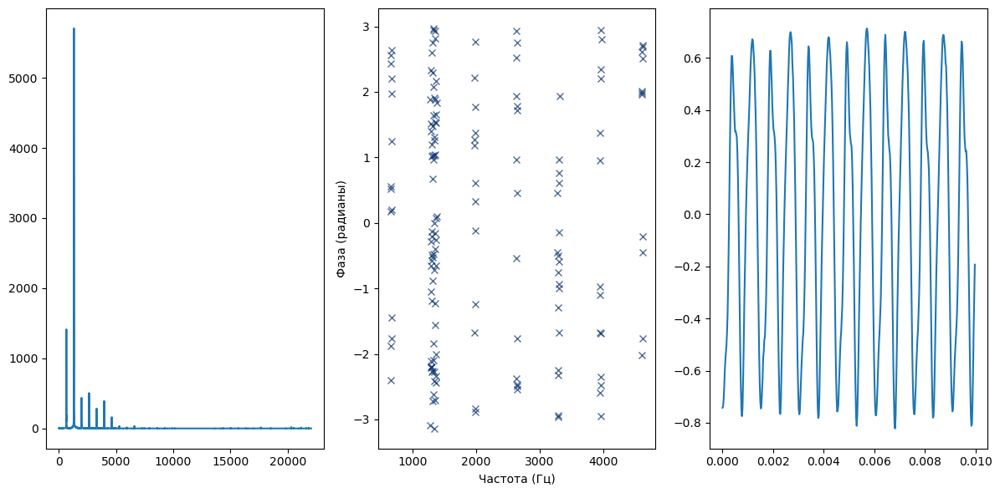

In [56]:
spectrum3 = random_angle(spectrum)
plot_three(spectrum4, thresh=50)